# Image Embedding Clustering and Visualization

Author: Cristian Lazo Quispe
email: clazoq@uni.pe

<a target="_blank" href="https://colab.research.google.com/github/CristianLazoQuispe/ClusteringImageEmbeddings/blob/main/01.Demo%20image%20embeddings.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Project Overview

This project focuses on clustering and visualizing image embeddings from the Oxford-IIIT Pet Dataset. We use various dimensionality reduction techniques and clustering algorithms to analyze and understand the structure of the image data.

## Dataset

- Original Dataset: [Oxford-IIIT Pet Dataset](https://huggingface.co/datasets/timm/oxford-iiit-pet)
- Augmented Dataset with Embeddings: [Oxford-IIIT Pet Augmented Embeddings](https://huggingface.co/datasets/CristianLazoQuispe/oxford-iiit-pet-aug-embeddings)

## Project Steps

1. **Data Loading and Preprocessing**
   - Load the original dataset
   - Apply data augmentation techniques to triple the dataset size
   - Generate image embeddings

2. **Dimensionality Reduction**
   We apply and compare three different dimensionality reduction techniques:
   - Principal Component Analysis (PCA)
   - t-Distributed Stochastic Neighbor Embedding (t-SNE)
   - Uniform Manifold Approximation and Projection (UMAP)

3. **Clustering**
   - Apply K-means clustering to the reduced embeddings

4. **Visualization Animation**
   Create interactive 2D and 3D visualizations for each dimensionality reduction technique:
   - PCA plots
   - t-SNE plots
   - UMAP plots

5. **Analysis**
   - Compare the effectiveness of each dimensionality reduction technique
   - Analyze cluster quality and separation
   - Identify potential insights about the dataset structure

## Requirements

- Python 3.7+
- Libraries: numpy, pandas, scikit-learn, umap-learn, plotly, matplotlib, seaborn

In [8]:
!pip install -q datasets

In [6]:
!pip install -q umap-learn==0.5.6

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 9.6 MB/s eta 0:00:00


In [7]:
!pip install -q plotly==5.22.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 56.5 MB/s eta 0:00:00


In [5]:
!pip install -q natsort==8.4.0

In [9]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from datasets import load_dataset,load_from_disk
from sklearn.manifold import TSNE
from umap import UMAP

print("Cuda availability : ",torch.cuda.is_available())

Cuda availability :  True


# Dowload datasets of images

In [10]:
if os.path.isdir('oxford-iiit-pet-aug-embeddings.hf'):
    # Load dataset
    dataset = load_from_disk("oxford-iiit-pet-aug-embeddings.hf")
else:
    # Dowload dataset
    #https://huggingface.co/datasets/CristianLazoQuispe/oxford-iiit-pet-aug-embeddings/viewer/default/train?p=110
    dataset = load_dataset("CristianLazoQuispe/oxford-iiit-pet-aug-embeddings")
    dataset.save_to_disk("oxford-iiit-pet-aug-embeddings.hf")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating train split:   0%|          | 0/11040 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/3669 [00:00<?, ? examples/s]

Saving the dataset (0/3 shards):   0%|          | 0/11040 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/3669 [00:00<?, ? examples/s]

In [11]:
# Data structure
print("Data structure:")
print(dataset)

Data structure:
DatasetDict({
    train: Dataset({
        features: ['image', 'label', 'image_id', 'label_cat_dog', 'embedding'],
        num_rows: 11040
    })
    test: Dataset({
        features: ['image', 'label', 'image_id', 'label_cat_dog', 'embedding'],
        num_rows: 3669
    })
})


In [12]:
dataset["train"].features

{'image': Image(mode=None, decode=True, id=None),
 'label': Value(dtype='int64', id=None),
 'image_id': Value(dtype='string', id=None),
 'label_cat_dog': Value(dtype='int64', id=None),
 'embedding': Sequence(feature=Value(dtype='float32', id=None), length=-1, id=None)}

In [13]:
dataset["test"].features

{'image': Image(mode=None, decode=True, id=None),
 'label': Value(dtype='int64', id=None),
 'image_id': Value(dtype='string', id=None),
 'label_cat_dog': Value(dtype='int64', id=None),
 'embedding': Sequence(feature=Value(dtype='float32', id=None), length=-1, id=None)}

CPU times: user 9.43 ms, sys: 0 ns, total: 9.43 ms
Wall time: 32.5 ms


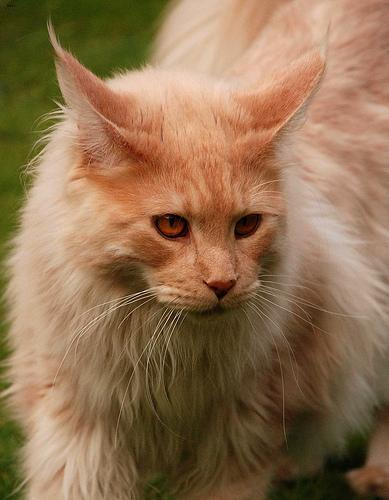

In [14]:
%%time
dataset['train'][0]["image"]

In [15]:
# Display additional statistics
print("\nDataset Statistics:")
print(f"Total number of images: {len(dataset['train']) + len(dataset['test'])}")
print(f"Images in the training set: {len(dataset['train'])}")
print(f"Images in the test set: {len(dataset['test'])}")
print(f"Number of classes: {len(set(dataset['train']['label']))}")


Dataset Statistics:
Total number of images: 14709
Images in the training set: 11040
Images in the test set: 3669
Number of classes: 37


# Data Visualization

In [16]:
# Function to display an image with its label
def show_image_with_label(ax, image, label):
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(label, fontsize=12)


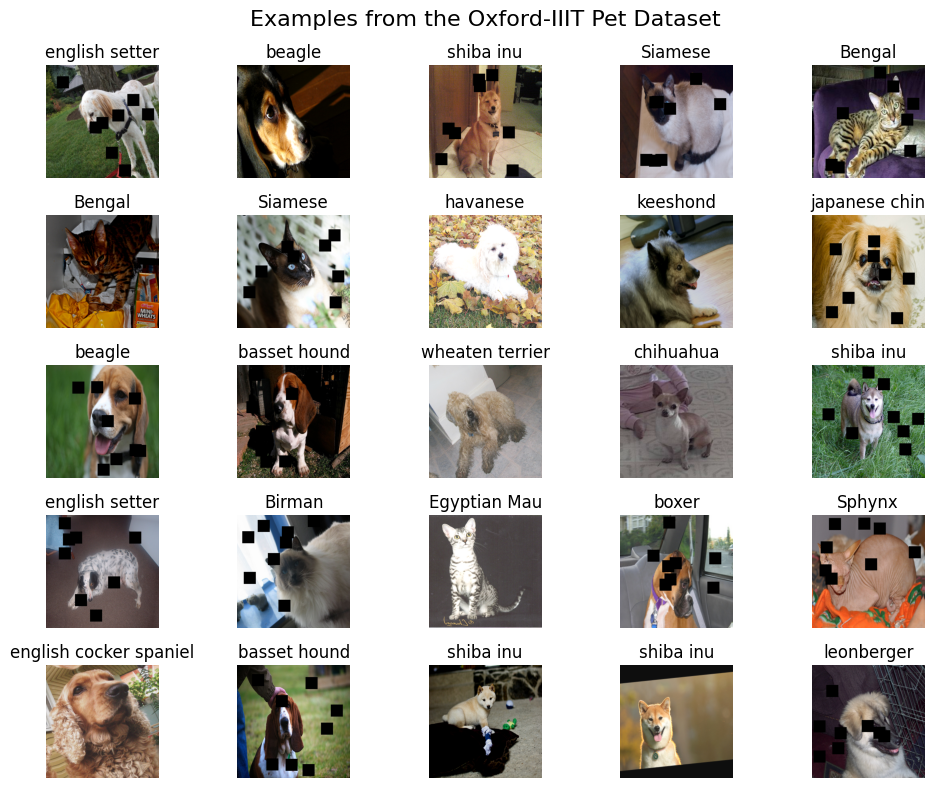

In [17]:
n = len(dataset['train'])
# Select 25 random examples
random_indices = np.random.choice(range(n-100,n-1), 25, replace=False)

# Create a 5x5 matrix with random examples
fig, axes = plt.subplots(5, 5, figsize=(10,8))
fig.suptitle("Examples from the Oxford-IIIT Pet Dataset", fontsize=16)

for i, ax in enumerate(axes.flatten()):
    example = dataset['train'][int(random_indices[i])]["image"]
    name    = dataset['train'][int(random_indices[i])]["image_id"]
    name    = " ".join(name.split("_")[:-1])

    show_image_with_label(ax, example, name)

plt.tight_layout()
plt.show()


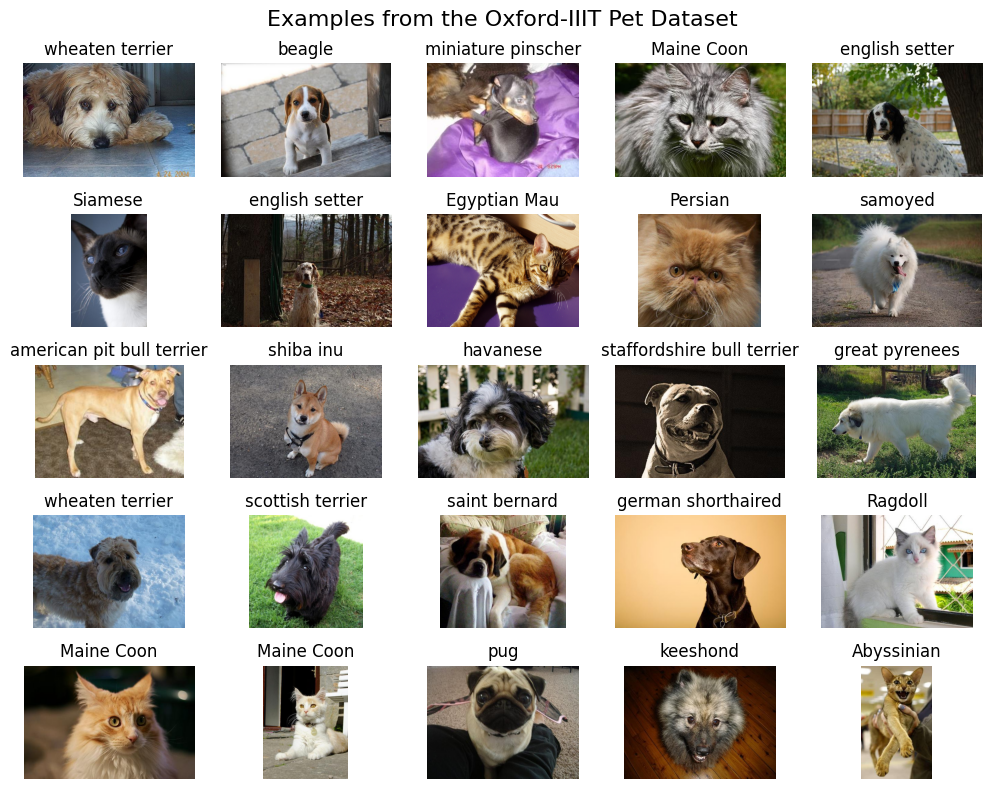

In [18]:
# Select 25 random examples
random_indices = [1000,1586, 379, 3445, 2039, 1944, 1445, 1810, 1421, 228, 757, 1757, 2274, 2894, 1987, 706, 3111, 2565, 1650, 1775, 1326, 2041, 3272, 1460, 3287]

# Create a 5x5 matrix with random examples
fig, axes = plt.subplots(5, 5, figsize=(10,8))
fig.suptitle("Examples from the Oxford-IIIT Pet Dataset", fontsize=16)

for i, ax in enumerate(axes.flatten()):
    example = dataset['train'][int(random_indices[i])]["image"]
    name    = dataset['train'][int(random_indices[i])]["image_id"]
    name    = " ".join(name.split("_")[:-1])

    show_image_with_label(ax, example, name)

plt.tight_layout()
plt.show()


# Dataframe creation

In [19]:
import pandas as pd
def get_dataframe(dataset,name):
    # Recopilar embeddings y etiquetas
    embeddings = np.array(dataset["embedding"])
    labels     = np.array(dataset["label"])
    image_ids  = np.array([" ".join(value.split("_")[:-1]) for value in list(dataset["image_id"])])

    # Crear el DataFrame
    df = pd.DataFrame({
        #"id": list(range(len(labels))),
        'label': labels,
        'name': image_ids,
        'embedding': embeddings.tolist(),
    })
    df.to_csv(f"df_{name}_image_embs.csv",index=False)
    return df

In [20]:
df_train_embs = get_dataframe(dataset["train"],"train")
df_test_embs  = get_dataframe(dataset["test"],"test")

In [21]:
df_train_embs.head(5)

,label,name,embedding
0,20,Maine Coon,"[6.509575843811035, -2.0269017219543457, 1.812..."
1,1,american bulldog,"[-6.19080924987793, -2.5210678577423096, 6.445..."
2,18,keeshond,"[9.060996055603027, 3.8637704849243164, -13.62..."
3,16,havanese,"[-3.285844326019287, 0.6554257869720459, -2.57..."
4,14,german shorthaired,"[-1.9041908979415894, -4.239225387573242, -2.8..."


In [22]:
df_test_embs.head(5)

,label,name,embedding
0,22,newfoundland,"[2.815667152404785, 29.375669479370117, 2.0275..."
1,25,pug,"[0.14567899703979492, 1.1345067024230957, 3.52..."
2,1,american bulldog,"[-6.802478790283203, -11.463345527648926, -12...."
3,15,great pyrenees,"[2.9825797080993652, -3.724004030227661, 6.483..."
4,16,havanese,"[-1.2629458904266357, -1.8017876148223877, -3...."


# Dimensionality Reduction

In [23]:
embeddings_total = np.concatenate([np.array(df_train_embs["embedding"].tolist()),np.array(df_test_embs["embedding"].tolist())])
embeddings_total.shape

(14709, 768)

### Create a color map for all visualizations

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
from natsort import natsorted

print(f"name: {name}")
# Create a unique color map for each label
unique_labels = natsorted(list(df_train_embs["name"].unique()))
print("unique_labels:",unique_labels[:5])
def generate_distinct_colors(n):
    base_colors = [
        '#e6194B', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#42d4f4', '#f032e6',
        '#bfef45', '#fabed4', '#469990', '#dcbeff', '#9A6324', '#fffac8', '#800000', '#aaffc3',
        '#808000', '#ffd8b1', '#000075', '#a9a9a9', '#000000', '#ffffff'
    ]

    # If we need more colors than we have in base_colors
    if n > len(base_colors):
        # Add colors from the 'husl' palette of seaborn
        additional_colors = sns.color_palette('husl', n - len(base_colors))
        additional_colors = [mcolors.rgb2hex(color) for color in additional_colors]
        base_colors.extend(additional_colors)

    return base_colors[:n]
# Assuming you already have unique_labels defined
color_map = dict(zip(unique_labels, generate_distinct_colors(len(unique_labels))))

name: Abyssinian
unique_labels: ['Abyssinian', 'Bengal', 'Birman', 'Bombay', 'British Shorthair']


In [25]:
import numpy as np
from umap import UMAP
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
from sklearn.preprocessing import StandardScaler
import plotly.express as px

def plot_3d_plotly(df,name=""):
    # Crear una paleta de colores
    color_scale = px.colors.qualitative.Plotly

    # Crear el gráfico 3D
    fig = go.Figure(data=[go.Scatter3d(
        x=df['UMAP1'],y=df['UMAP2'],z=df['UMAP3'],mode='markers',
        marker=dict(
            size=5,
            color=df['color'],  # set color to an array/list of desired values
            colorscale=color_scale,  # choose a colorscale
            opacity=0.8
        ),
        text=df['label'],  # This will be displayed on hover
        hoverinfo='text'
    )])

    # Actualizar el diseño
    fig.update_layout(
        title=f'UMAP 3D projection of the dataset {name}',
        scene=dict(
            xaxis_title='UMAP1',
            yaxis_title='UMAP2',
            zaxis_title='UMAP3'
        ),
        width=900,
        height=700,
        margin=dict(r=20, b=10, l=10, t=10)
    )

    # Mostrar el gráfico
    fig.show()

    # Si quieres guardar el gráfico como un archivo HTML interactivo:
    fig.write_html("umap_3d_plot.html")

## Dimensionality reduction with PCA

In [26]:
from sklearn.decomposition import PCA

# Aplicar PCA
pca = PCA(n_components=3, random_state=42)
embeddings_3d_total = pca.fit_transform(embeddings_total)
embeddings_3d_train = embeddings_3d_total[:df_train_embs.shape[0],:]
embeddings_3d_test  = embeddings_3d_total[df_train_embs.shape[0]:,:]
print(embeddings_3d_train.shape)
print(embeddings_3d_test.shape)
df = pd.DataFrame({
    'UMAP1': embeddings_3d_train[:, 0],
    'UMAP2': embeddings_3d_train[:, 1],
    'UMAP3': embeddings_3d_train[:, 2],
    'label':  np.array([" ".join(value.split("_")[:-1]) for value in list(dataset["train"]["image_id"])])
})
df["color"] = df["label"].map(color_map)
# Opcional: Imprimir la varianza explicada
print("Varianza explicada:", pca.explained_variance_ratio_)

(11040, 3)
(3669, 3)
Varianza explicada: [0.13112973 0.05645711 0.04766651]


In [27]:
plot_3d_plotly(df,name="PCA")

## Dimensionality reduction with UMAP

In [28]:
import numpy as np
from umap import UMAP
import matplotlib.pyplot as plt
#from sklearn.preprocessing import StandardScaler


# Aplicar UMAP
umap_model = UMAP(n_neighbors=37, min_dist=0.1, n_components=3, metric="euclidean",random_state=42)
embeddings_3d_total = umap_model.fit_transform(embeddings_total)
embeddings_3d_train = embeddings_3d_total[:df_train_embs.shape[0],:]
embeddings_3d_test  = embeddings_3d_total[df_train_embs.shape[0]:,:]

df = pd.DataFrame({
    'UMAP1': embeddings_3d_train[:, 0],
    'UMAP2': embeddings_3d_train[:, 1],
    'UMAP3': embeddings_3d_train[:, 2],
    'label':  np.array([" ".join(value.split("_")[:-1]) for value in list(dataset["train"]["image_id"])])
})
df["color"] = df["label"].map(color_map)


print(embeddings_3d_train.shape)
print(embeddings_3d_test.shape)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



(11040, 3)
(3669, 3)


In [29]:
plot_3d_plotly(df,name="UMAP")

## Dimensionality reduction with t-SNE

In [31]:
# Aplicar t-SNE
tsne = TSNE(n_components=3, random_state=42)
embeddings_3d_total = tsne.fit_transform(embeddings_total)
embeddings_3d_train = embeddings_3d_total[:df_train_embs.shape[0],:]
embeddings_3d_test  = embeddings_3d_total[df_train_embs.shape[0]:,:]

df = pd.DataFrame({
    'UMAP1': embeddings_3d_train[:, 0],
    'UMAP2': embeddings_3d_train[:, 1],
    'UMAP3': embeddings_3d_train[:, 2],
    'label':  np.array([" ".join(value.split("_")[:-1]) for value in list(dataset["train"]["image_id"])])
})
df["color"] = df["label"].map(color_map)
print(embeddings_3d_train.shape)
print(embeddings_3d_test.shape)

(11040, 3)
(3669, 3)


In [32]:
plot_3d_plotly(df,name="TSNE")

# Animation with T-SNE

In [33]:
# Applying t-SNE
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d_total = tsne.fit_transform(embeddings_total)
embeddings_2d_train = embeddings_2d_total[:df_train_embs.shape[0],:]
embeddings_2d_test  = embeddings_2d_total[df_train_embs.shape[0]:,:]
print(embeddings_2d_train.shape)
print(embeddings_2d_test.shape)

(11040, 2)
(3669, 2)


In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
from natsort import natsorted

def plot_tsne(df, embeddings_2d,name,column_name,filename,color_map=None):
    print(f"name: {name}")
    # Create a unique color map for each label
    unique_labels = natsorted(list(df[column_name].unique()))
    print("unique_labels:",unique_labels[:5])
    def generate_distinct_colors(n):
        base_colors = [
            '#e6194B', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#42d4f4', '#f032e6',
            '#bfef45', '#fabed4', '#469990', '#dcbeff', '#9A6324', '#fffac8', '#800000', '#aaffc3',
            '#808000', '#ffd8b1', '#000075', '#a9a9a9', '#000000', '#ffffff'
        ]

        # If we need more colors than we have in base_colors
        if n > len(base_colors):
            # Add colors from the 'husl' palette of seaborn
            additional_colors = sns.color_palette('husl', n - len(base_colors))
            additional_colors = [mcolors.rgb2hex(color) for color in additional_colors]
            base_colors.extend(additional_colors)

        return base_colors[:n]
    if color_map is None:
        # Assuming you already have unique_labels defined
        color_map = dict(zip(unique_labels, generate_distinct_colors(len(unique_labels))))
    #print(color_map)
    # Create the figure
    fig = plt.figure(figsize=(16, 10))

    # Plot each group separately
    for label in unique_labels:
        mask = df[column_name] == label
        plt.scatter(embeddings_2d[mask, 0], embeddings_2d[mask, 1],
                    c=[color_map[label]], label=label, alpha=0.7)

    # Add labels
    name_count = {label_name:0 for label_name in list(df['name'])}
    for i, label_name in enumerate(df['name']):
        name_count[label_name]+=1

        #if i % 60 == 0:  # Etiqueta cada 50 puntos, ajusta según necesites
        if name_count[label_name]<3:
            plt.annotate(label_name, (embeddings_2d[i, 0], embeddings_2d[i, 1]),
                         xytext=(5, 5), textcoords='offset points', fontsize=8)


    # Configure the plot
    plt.title(f't-SNE visualization of {name}', fontsize=20)
    plt.xlabel('t-SNE feature 1', fontsize=14)
    plt.ylabel('t-SNE feature 2', fontsize=14)

    # Add the legend
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

    # Adjust the layout and display the plot
    plt.tight_layout()
    plt.show()

    fig.savefig(filename, bbox_inches='tight', pad_inches=0)

    # Print some statistics
    print(f"Number of classes: {len(set(df[column_name]))}")
    print(f"Number of processed images: {len(embeddings_2d)}")
    return fig, color_map

name: train real
unique_labels: ['Abyssinian', 'Bengal', 'Birman', 'Bombay', 'British Shorthair']


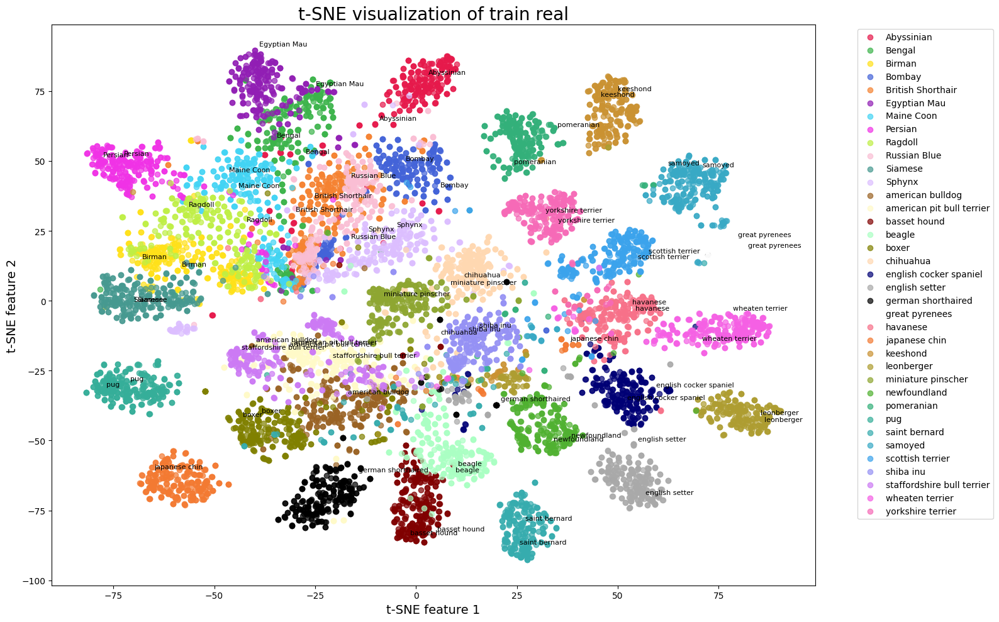

Number of classes: 37
Number of processed images: 11040


In [35]:
train_tsne_fig, color_map = plot_tsne(df_train_embs, embeddings_2d_train,"train real",column_name="name",filename="train_tsne.png",color_map=color_map)

name: test real
unique_labels: ['Abyssinian', 'Bengal', 'Birman', 'Bombay', 'British Shorthair']


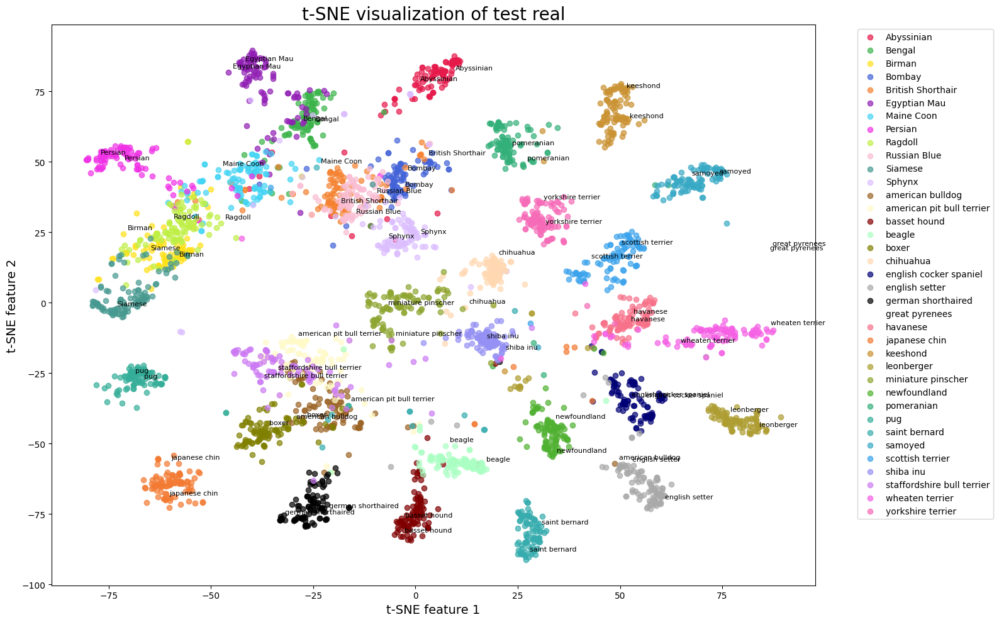

Number of classes: 37
Number of processed images: 3669


In [36]:
test_tsne_fig = plot_tsne(df_test_embs, embeddings_2d_test,"test real",column_name="name",filename="test_tsne.png",color_map=color_map)

In [37]:
len(set(df_train_embs["label"]))

37

# Clustering with KMeans library

In [38]:
from sklearn.cluster import KMeans

# Perform K-means clustering with cosine similarity
kmeans = KMeans(n_clusters=37, random_state=42)
cluster_train_labels = kmeans.fit_predict(embeddings_2d_train)
cluster_test_labels  = kmeans.predict(embeddings_2d_test)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [39]:
df_train_embs["cluster"] = cluster_train_labels
df_test_embs["cluster"] = cluster_test_labels

In [40]:
cluster_name_dict = df_train_embs.groupby('cluster')['name'].agg(lambda x: x.mode()[0]).to_dict()
cluster_name_dict

{0: 'Bombay',
 1: 'american bulldog',
 2: 'scottish terrier',
 3: 'Siamese',
 4: 'boxer',
 5: 'Maine Coon',
 6: 'english cocker spaniel',
 7: 'Sphynx',
 8: 'beagle',
 9: 'samoyed',
 10: 'pug',
 11: 'shiba inu',
 12: 'english setter',
 13: 'american pit bull terrier',
 14: 'Egyptian Mau',
 15: 'chihuahua',
 16: 'japanese chin',
 17: 'leonberger',
 18: 'Birman',
 19: 'keeshond',
 20: 'Persian',
 21: 'wheaten terrier',
 22: 'great pyrenees',
 23: 'saint bernard',
 24: 'Russian Blue',
 25: 'basset hound',
 26: 'german shorthaired',
 27: 'yorkshire terrier',
 28: 'pomeranian',
 29: 'newfoundland',
 30: 'miniature pinscher',
 31: 'shiba inu',
 32: 'havanese',
 33: 'British Shorthair',
 34: 'Ragdoll',
 35: 'Abyssinian',
 36: 'staffordshire bull terrier'}

In [41]:
df_train_embs['cluster_name'] = df_train_embs['cluster'].map(cluster_name_dict)
df_test_embs['cluster_name']  = df_test_embs['cluster'].map(cluster_name_dict)

name: train Kmeans
unique_labels: ['Abyssinian', 'Birman', 'Bombay', 'British Shorthair', 'Egyptian Mau']


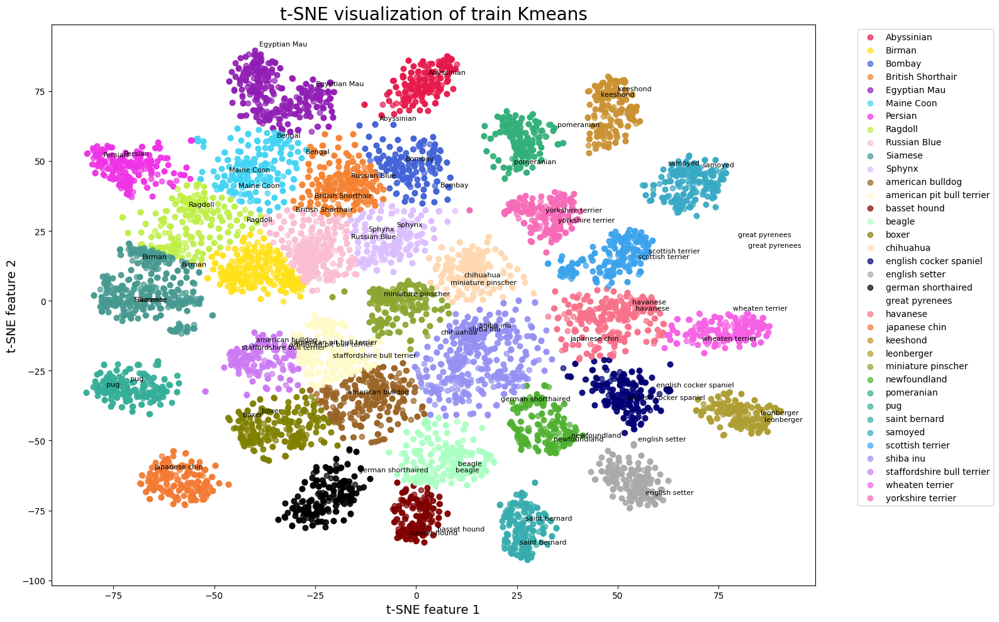

Number of classes: 36
Number of processed images: 11040


In [42]:
train_tsne_kmeans_fig = plot_tsne(df_train_embs, embeddings_2d_train,"train Kmeans",column_name="cluster_name",filename="train_tsne_kmeans.png",color_map=color_map)

name: test Kmeans
unique_labels: ['Abyssinian', 'Birman', 'Bombay', 'British Shorthair', 'Egyptian Mau']


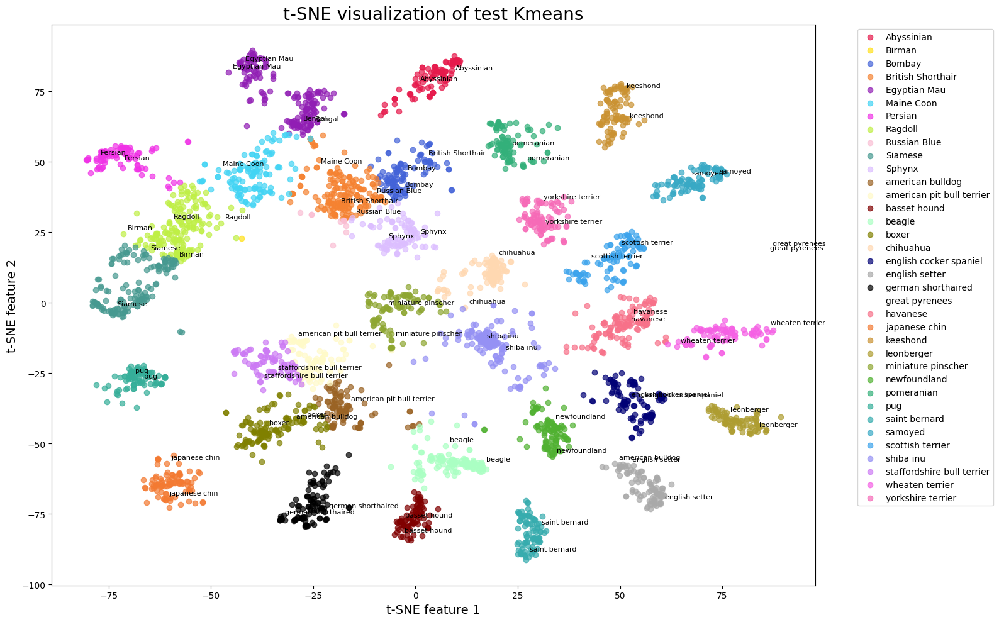

Number of classes: 36
Number of processed images: 3669


In [43]:
train_tsne_kmeans_fig = plot_tsne(df_test_embs, embeddings_2d_test,"test Kmeans",column_name="cluster_name",filename="test_tsne_kmeans.png",color_map=color_map)

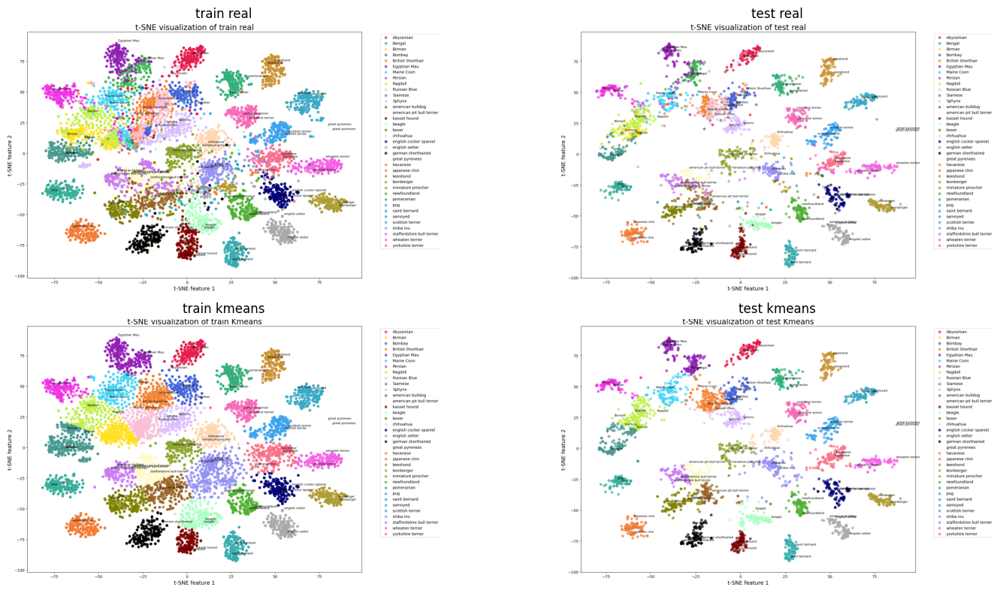

In [44]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# List of image file names
image_files  = ['train_tsne.png', 'test_tsne.png', 'train_tsne_kmeans.png','test_tsne_kmeans.png']
image_titles = ["train real", "test real", "train kmeans", "test kmeans"]

# Create a figure and axes for the 2x2 matrix plot
fig, axs = plt.subplots(2, 2, figsize=(16, 8))

# Iterate over the image files and plot them in the corresponding subplots
for i, (image_file,title_file) in enumerate(zip(image_files,image_titles)):
    # Read the image using matplotlib
    img = mpimg.imread(image_file)

    # Calculate the row and column indices for the current subplot
    row = i // 2
    col = i % 2

    # Plot the image in the corresponding subplot
    axs[row, col].imshow(img)

    axs[row, col].set_title(title_file)

    # Remove the axis ticks and labels
    axs[row, col].axis('off')

# Adjust the spacing between subplots
plt.tight_layout()
# Display the plot
plt.show()

In [45]:
from sklearn.metrics import precision_score

In [46]:
print(f'Train precision : {precision_score(df_train_embs["name"], df_train_embs["cluster_name"], average="weighted",zero_division=0)}')
print(f'Test  precision : {precision_score(df_test_embs["name"], df_test_embs["cluster_name"], average="weighted",zero_division=0)}')

Train precision : 0.7801574653776497
Test  precision : 0.795253192856051


In [47]:
df_train_embs.head()

,label,name,embedding,cluster,cluster_name
0,20,Maine Coon,"[6.509575843811035, -2.0269017219543457, 1.812...",5,Maine Coon
1,1,american bulldog,"[-6.19080924987793, -2.5210678577423096, 6.445...",1,american bulldog
2,18,keeshond,"[9.060996055603027, 3.8637704849243164, -13.62...",19,keeshond
3,16,havanese,"[-3.285844326019287, 0.6554257869720459, -2.57...",32,havanese
4,14,german shorthaired,"[-1.9041908979415894, -4.239225387573242, -2.8...",31,shiba inu


In [48]:
embeddings_2d_train.shape

(11040, 2)

# Clustering with Kmeans and Kmedoids from scratch

In [49]:
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [50]:
def euclidean_distance(x1, x2):
    return np.sqrt(np.sum((x1 - x2)**2))

#Kmeansembeddings_3d_train = embeddings_3d_total[:df_train_embs.shape[0],:]
embeddings_3d_test  = embeddings_3d_total[df_train_embs.shape[0]:,:]

df = pd.DataFrame({
    'UMAP1': embeddings_3d_train[:, 0],
    'UMAP2': embeddings_3d_train[:, 1],
    'UMAP3': embeddings_3d_train[:, 2],
    'label':  np.array([" ".join(value.split("_")[:-1]) for value in list(dataset["train"]["image_id"])])
})
df["color"] = df["label"].map(color_map)
print(embeddings_3d_train.shape)
print(embeddings_3d_test.shape)
def kmeans_predict(centroids, cluster_ids, X_test):
    y_pred = []
    for x_test in X_test:
        distances = [euclidean_distance(x_test, center) for center in centroids]
        k_indice = np.argmin(distances)#get minimum
        cluster_id = cluster_ids[k_indice]
        y_pred.append(cluster_id)
    return np.array(y_pred)

def kmedoids_predict(medoids, cluster_ids,X_test):
    y_pred = []
    for x_test in X_test:
        distances = [euclidean_distance(x_test, medoid) for medoid in medoids]
        medoid_index = np.argmin(distances)
        cluster_id = cluster_ids[medoid_index]
        y_pred.append(cluster_id)
    return np.array(y_pred)


def kmedoids_update(n_clusters,X_train,y_train,centroids):
    for i in range(n_clusters):
        cluster_points = X_train[y_train == i]
        if len(cluster_points) > 0:
            # Calculate the mean of the cluster
            cluster_mean = np.mean(cluster_points, axis=0)
            # Find the point closest to the mean
            distances_to_mean = [euclidean_distance(point, cluster_mean) for point in cluster_points]
            new_medoid_index = np.argmin(distances_to_mean)
            centroids[i] = cluster_points[new_medoid_index]
    return centroids


def kmeans_update(n_clusters,X_train,y_train,centroids):
    for i in range(n_clusters):
       if np.sum(y_train == i) > 0:  # Evitar división por cero
            centroids[i] = np.mean(X_train[y_train == i], axis=0)
    return centroids

In [51]:
np.argmin([2,3,1,10])

2

In [52]:
fixed_colors= [color_map[value] for value in color_map.keys()]
print(fixed_colors)

['#e6194B', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#42d4f4', '#f032e6', '#bfef45', '#fabed4', '#469990', '#dcbeff', '#9A6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#a9a9a9', '#000000', '#ffffff', '#f77189', '#f37a32', '#ca9232', '#ae9d31', '#8ea631', '#50b131', '#33b07a', '#35ae99', '#36acae', '#38a9c5', '#3ba3ec', '#9591f4', '#cc7af4', '#f560e4', '#f66ab7']


In [53]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_agg import FigureCanvasAgg

def create_frame(X_train, y_train, centroids, n_clusters, frame,model="",title=""):
    fig, ax = plt.subplots(figsize=(15, 15), tight_layout=True)

    # Usar colores fijos para los puntos
    for label in range(n_clusters):
        mask = y_train == label
        ax.scatter(X_train[mask, 0], X_train[mask, 1],
                   c=[fixed_colors[label % len(fixed_colors)]],
                   alpha=0.4,s=150, label=label, edgecolor='black', linewidth=0.5)


    # Usar colores fijos para los centroides
    centroid_scatter = ax.scatter(centroids[:, 0], centroids[:, 1],
                                  c=[fixed_colors[i % len(fixed_colors)] for i in range(n_clusters)],
                                  s=500, edgecolor='black', linewidth=6)

    ax.set_xlim(X_train[:, 0].min() - 0.1, X_train[:, 0].max() + 0.1)
    ax.set_ylim(X_train[:, 1].min() - 0.1, X_train[:, 1].max() + 0.1)
    if title == "":
        fig.suptitle(f'{model.capitalize()} Animation with Updating Centroids (Frame {frame+1})', fontsize=36)
    else:
        fig.suptitle(title, fontsize=36)

    # Eliminar los ejes y bordes
    ax.axis('off')
    fig.patch.set_visible(False)

    # Convertir la figura a un array de NumPy
    canvas = FigureCanvasAgg(fig)
    canvas.draw()

    # Obtener el tamaño de la imagen en píxeles
    width, height = fig.get_size_inches() * fig.get_dpi()

    # Obtener el array de la imagen sin bordes
    image_array = np.frombuffer(canvas.tostring_rgb(), dtype='uint8').reshape(int(height), int(width), 3)

    # Cerrar la figura para liberar memoria
    plt.close(fig)

    return image_array

# Types of Initialization

In [54]:
def initialize_centroids(X_train, n_clusters):
    # Obtener los valores mínimos y máximos para cada dimensión
    min_x, max_x = X_train[:, 0].min(), X_train[:, 0].max()
    min_y, max_y = X_train[:, 1].min(), X_train[:, 1].max()

    # Generar centroides aleatorios dentro del rango de los datos
    centroids = np.random.rand(n_clusters, 2)
    centroids[:, 0] = centroids[:, 0] * (max_x - min_x) + min_x
    centroids[:, 1] = centroids[:, 1] * (max_y - min_y) + min_y

    return centroids

def initialize_centroids_center(X_train, n_clusters,factor=1):
    # Obtener los valores mínimos y máximos para cada dimensión
    min_x, max_x = X_train[:, 0].min(), X_train[:, 0].max()
    min_y, max_y = X_train[:, 1].min(), X_train[:, 1].max()

    # Generar centroides aleatorios dentro del rango de los datos
    centroids = (np.random.rand(n_clusters, 2)-0.5)*factor
    centroids[:, 0] = np.minimum(max_x,np.maximum(min_x,centroids[:, 0] * (max_x - min_x) + (max_x + min_x)//2))
    centroids[:, 1] = np.minimum(max_y,np.maximum(min_y,centroids[:, 1] * (max_y - min_y) + (max_y + min_y)//2))

    return centroids



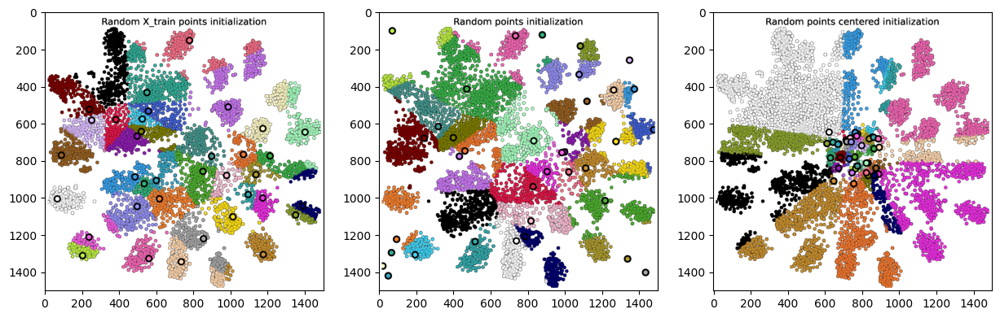

In [61]:
# Initializations

X_train = embeddings_2d_train
n_clusters = 37
model = "kmeans"
frame=0

centroids = X_train[np.random.choice(X_train.shape[0], n_clusters, replace=False)]
y_train = kmedoids_predict(centroids, np.arange(n_clusters), X_train)
image_1 = create_frame(X_train, y_train, centroids, n_clusters, frame,model=model,title="Random X_train points initialization")
centroids = initialize_centroids(X_train, n_clusters)
y_train = kmedoids_predict(centroids, np.arange(n_clusters), X_train)
image_2 = create_frame(X_train, y_train, centroids, n_clusters, frame,model=model,title="Random points initialization")
centroids = initialize_centroids_center(X_train, n_clusters,factor=0.2)
y_train = kmedoids_predict(centroids, np.arange(n_clusters), X_train)
image_3 = create_frame(X_train, y_train, centroids, n_clusters, frame,model=model,title="Random points centered initialization")

fig = plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(image_1)
plt.subplot(1,3,2)
plt.imshow(image_2)
plt.subplot(1,3,3)
plt.imshow(image_3)
plt.show()

In [62]:
import tqdm
# Preparar los datos
X_train = embeddings_2d_train
n_clusters = 37
model = "kmedoids"
model = "kmeans"

# Inicializar centroides aleatoriamente
#centroids = X_train[np.random.choice(X_train.shape[0], n_clusters, replace=False)]
#centroids = initialize_centroids(X_train, n_clusters)
centroids = initialize_centroids_center(X_train, n_clusters,factor=0.2)

images_list = []
for frame in tqdm.tqdm(range(0,30)):
    if model=="kmedoids":
        y_train = kmedoids_predict(centroids, np.arange(n_clusters), X_train)
    else:
        y_train = kmeans_predict(centroids, np.arange(n_clusters), X_train)

    #plot
    image = create_frame(X_train, y_train, centroids, n_clusters, frame,model=model)

    # Update centroids
    if model=="kmedoids":
        centroids = kmedoids_update(n_clusters,X_train,y_train,centroids)
    else:
        centroids = kmeans_update(n_clusters,X_train,y_train,centroids)

    images_list.append(image)

100%|██████████| 30/30 [02:23<00:00,  4.78s/it]


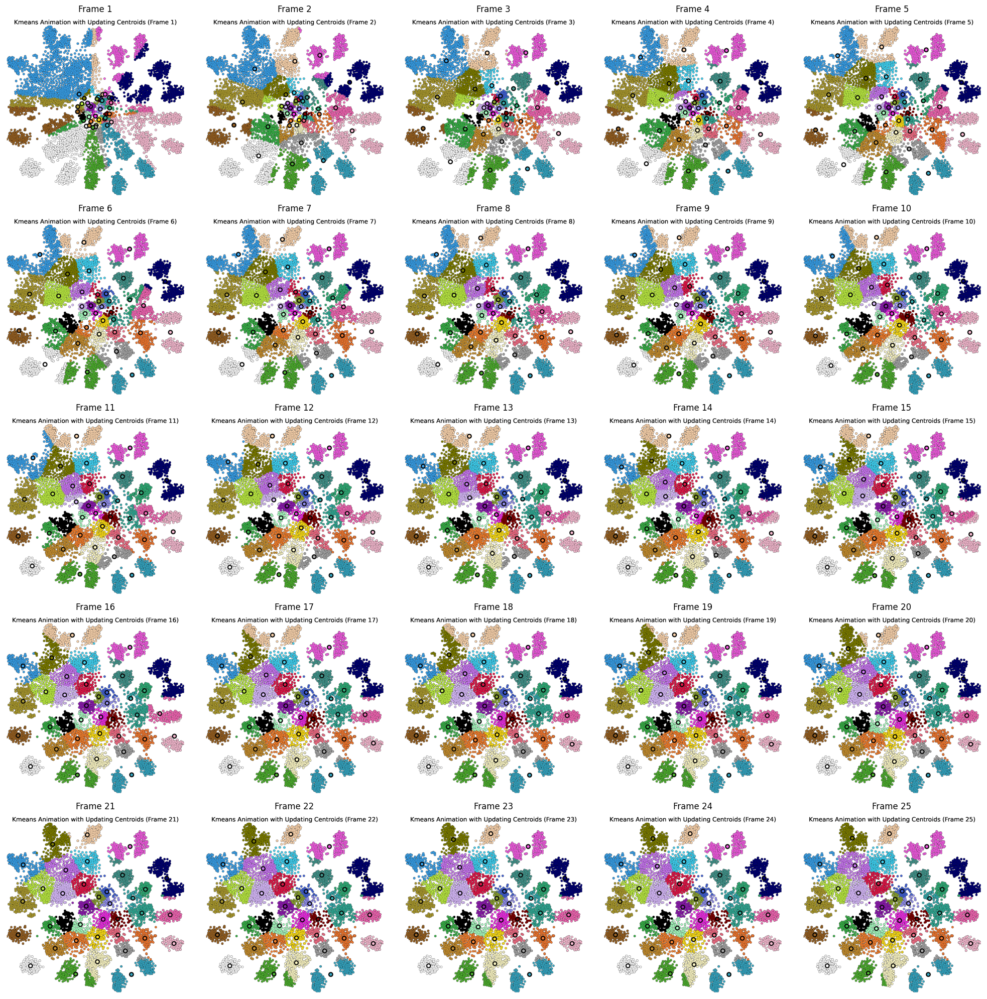

In [63]:
import matplotlib.pyplot as plt
import numpy as np

def plot_image_matrix(images_list, rows=5, cols=5):
    fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
    fig.subplots_adjust(hspace=0.3, wspace=0.3)

    for i, ax in enumerate(axes.flat):
        if i < len(images_list):
            try:
                ax.imshow(images_list[i])
            except:
                pass
            ax.axis('off')
            ax.set_title(f'Frame {i+1}')
        else:
            ax.axis('off')

    plt.tight_layout()
    return fig

# Uso de la función
num_images = 25  # Asumimos que tienes al menos 25 imágenes
fig = plot_image_matrix(images_list[:num_images])
plt.show()

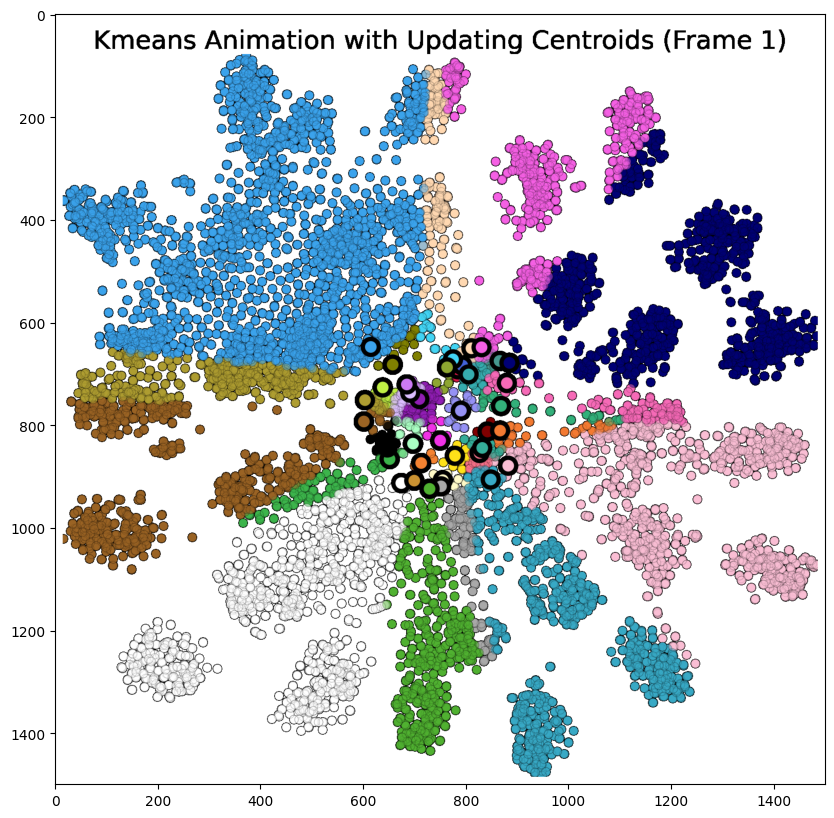

In [64]:
fig = plt.figure(figsize=(10,10))
plt.imshow(images_list[0])
plt.show()

In [65]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter, FFMpegWriter
import numpy as np
from IPython.display import HTML, display
import base64

def create_animation(images_list, fps=10, output_format='gif',model=""):
    """
    Crea una animación a partir de una lista de imágenes.

    :param images_list: Lista de arrays de NumPy representando las imágenes.
    :param fps: Frames por segundo (controla la velocidad de la animación).
    :param output_format: 'gif' o 'mp4'.
    :return: Objeto de animación o ruta del archivo guardado.
    """
    fig, ax = plt.subplots(figsize=(10,10))
    ax.axis('off')
    im = ax.imshow(images_list[0])

    def update(frame):
        im.set_array(images_list[frame])
        return [im]

    anim = FuncAnimation(fig, update, frames=len(images_list), interval=1000/fps, blit=True)

    if output_format == 'gif':
        # Guardar como GIF
        writer = PillowWriter(fps=fps)
        anim.save(f"animation_{model}.gif", writer=writer)
        plt.close(fig)
        return f"animation_{model}.gif"
    elif output_format == 'mp4':
        # Guardar como MP4
        writer = FFMpegWriter(fps=fps)
        anim.save(f"animation_{model}.mp4", writer=writer)
        plt.close(fig)
        return f"animation_{model}.mp4"
    else:
        return anim

def display_animation(file_path, format='gif',width=400):
    """
    Muestra la animación en el notebook.

    :param file_path: Ruta al archivo de animación.
    :param format: 'gif' o 'mp4'.
    """
    if format == 'gif':
        with open(file_path, 'rb') as f:
            display(HTML('<img src="data:image/gif;base64,{}"/>'.format(base64.b64encode(f.read()).decode())))
    elif format == 'mp4':
        video = open(file_path, "rb").read()
        video_url = "data:video/mp4;base64," + base64.b64encode(video).decode()
        display(HTML(f"""
        <video width={width} controls>
            <source src="{video_url}" type="video/mp4">
        </video>
        """))

In [66]:
fps = 1  # Ajusta este valor para cambiar la velocidad (más alto = más rápido)
output_format = 'mp4'  # Cambia a 'mp4' si prefieres un video
animation_file = create_animation(images_list, fps=fps, output_format=output_format,model=model)

In [67]:
display_animation(animation_file, format=output_format,width=900)

In [68]:
output_format = 'gif'  # Cambia a 'mp4' si prefieres un video
animation_file = create_animation(images_list, fps=fps, output_format=output_format,model=model)

In [69]:
#from IPython.display import Video
#Video("animation.mp4",width=900,height=900)

In [70]:
#from IPython.display import Image, display
#from ipywidgets import Video
#Video.from_file("animation.mp4", width=320, height=320)

In [71]:
df_test_embs.head()

,label,name,embedding,cluster,cluster_name
0,22,newfoundland,"[2.815667152404785, 29.375669479370117, 2.0275...",29,newfoundland
1,25,pug,"[0.14567899703979492, 1.1345067024230957, 3.52...",10,pug
2,1,american bulldog,"[-6.802478790283203, -11.463345527648926, -12....",12,english setter
3,15,great pyrenees,"[2.9825797080993652, -3.724004030227661, 6.483...",22,great pyrenees
4,16,havanese,"[-1.2629458904266357, -1.8017876148223877, -3....",32,havanese


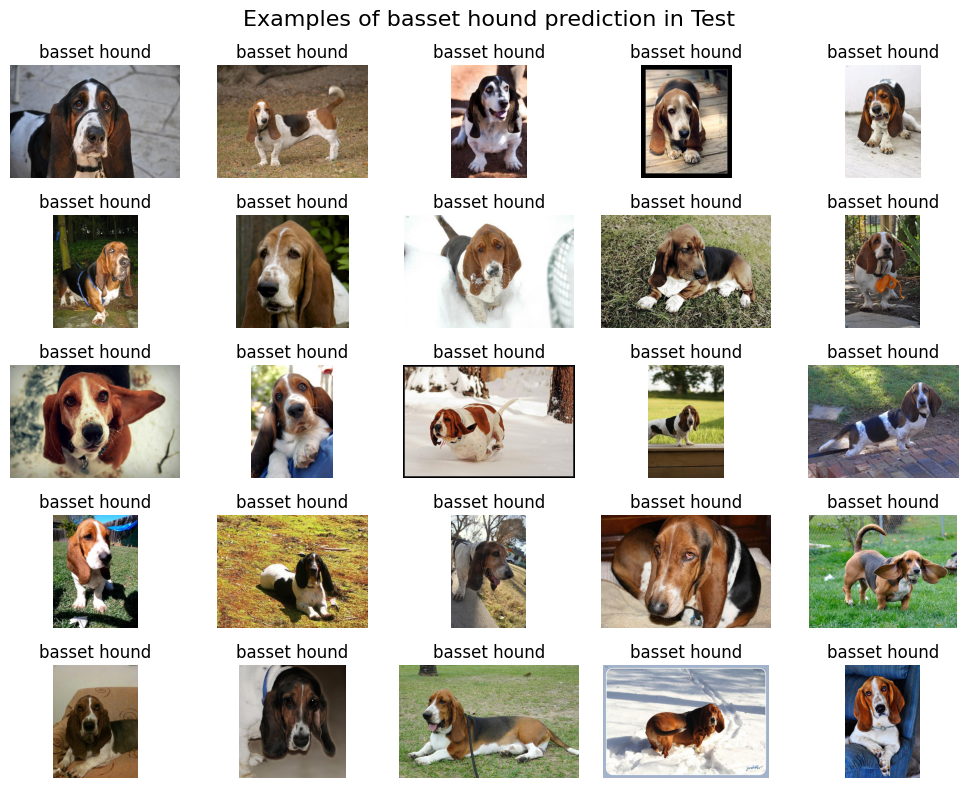

In [72]:
label_name = "basset hound"
ids_test_prediction = list(df_test_embs[df_test_embs["cluster_name"]==label_name].index)[::-1]
n = len(dataset['train'])
# Select 25 random examples
random_indices = ids_test_prediction

# Create a 5x5 matrix with random examples
fig, axes = plt.subplots(5, 5, figsize=(10,8))
fig.suptitle(f"Examples of {label_name} prediction in Test", fontsize=16)

for i, ax in enumerate(axes.flatten()):
    example = dataset['test'][int(random_indices[i])]["image"]
    name    = dataset['test'][int(random_indices[i])]["image_id"]
    name    = " ".join(name.split("_")[:-1])

    show_image_with_label(ax, example, name)

plt.tight_layout()
plt.show()


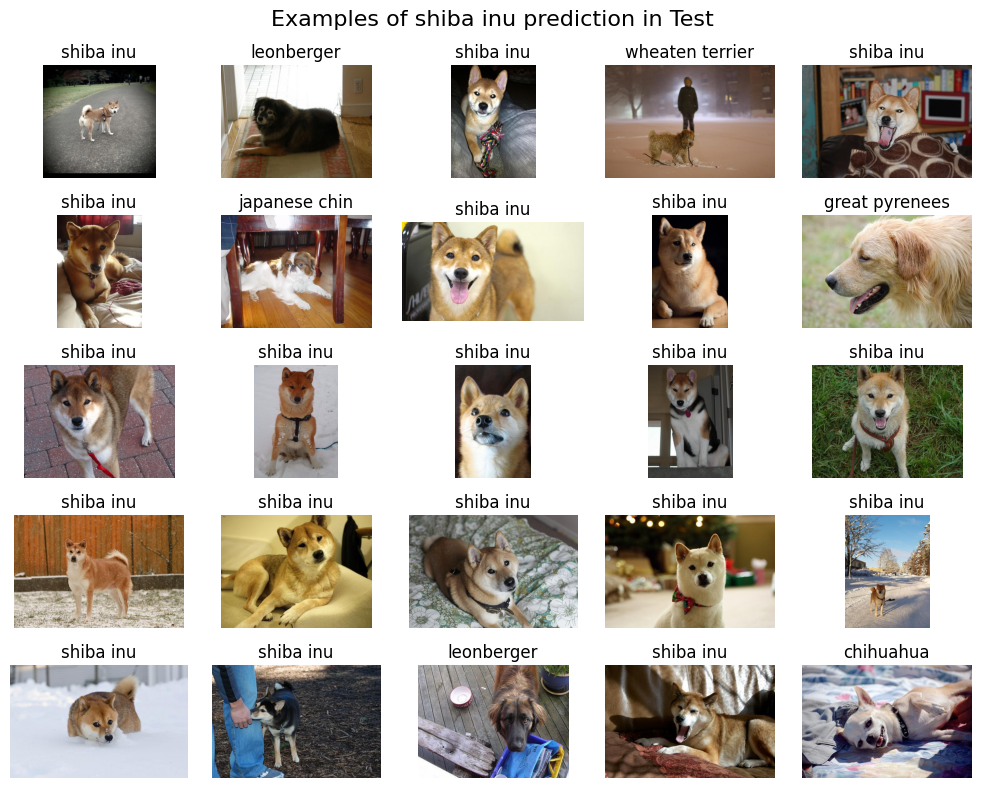

In [73]:
label_name = "shiba inu"
ids_test_prediction = list(df_test_embs[df_test_embs["cluster_name"]==label_name].index)[::-1]
n = len(dataset['train'])
# Select 25 random examples
random_indices = ids_test_prediction

# Create a 5x5 matrix with random examples
fig, axes = plt.subplots(5, 5, figsize=(10,8))
fig.suptitle(f"Examples of {label_name} prediction in Test", fontsize=16)

for i, ax in enumerate(axes.flatten()):
    example = dataset['test'][int(random_indices[i])]["image"]
    name    = dataset['test'][int(random_indices[i])]["image_id"]
    name    = " ".join(name.split("_")[:-1])

    show_image_with_label(ax, example, name)

plt.tight_layout()
plt.show()
